Dataset Desription:

**Transaction Data**

Transaction_ID: Unique identifier for each transaction.

Customer_ID: Unique identifier for the customer associated with the transaction.

Product_ID: Unique identifier for the product purchased in the transaction.

Transaction_Date: The date when the transaction occurred.

**Product Information**

Category: The category to which the product belongs (e.g., Electronics, Clothing).

Units_Sold: The quantity of the product sold in the transaction.

Discount_Applied: The discount percentage applied to the product during the transaction.

Revenue: Total revenue generated from the transaction, calculated as Price x Units Sold x (1 - Discount).

**Customer Demographics**

Customer_ID: Unique identifier for each customer (repeated for easier reference).

**Advertising Metrics**

Clicks: Number of ad clicks associated with the product during the time of the transaction.

Impressions: Number of ad impressions served during the campaign.

Conversion_Rate: Calculated as Clicks / Impressions, representing the percentage of impressions that resulted in clicks.

Ad_CTR: Click-through rate (CTR) for the advertisement, representing the effectiveness of the ad campaign.

Ad_CPC: Cost-per-click for the advertisement.

Ad_Spend: Total advertising spend for the product, calculated as Ad_CTR x Ad_CPC x 1000.

**Seasonal and Regional Information**

Region: The geographical region where the transaction occurred (e.g., North America, Europe, Asia).

Seasonality Effects: Implied through patterns in transaction dates and revenue, reflecting holiday promotions and season-based purchasing trends.

https://www.kaggle.com/datasets/imranalishahh/comprehensive-synthetic-e-commerce-dataset

In [8]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import holidays
import plotly.express as px

from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
# Load the dataset
df=pd.read_csv('synthetic_ecommerce_data.csv')

In [ ]:
# Checking the first five rows to ensure the data is loaded correctly
df.head()

,Transaction_ID,Customer_ID,Product_ID,Transaction_Date,Units_Sold,Discount_Applied,Revenue,Clicks,Impressions,Conversion_Rate,Category,Region,Ad_CTR,Ad_CPC,Ad_Spend
0,8b460852-7c64-46fa-998b-b0976879d082,Customer_65,Product_224,2024-10-06,134,0.14,305.54,11,65,0.17,Electronics,Europe,0.0180,0.55,9.90
1,418612e7-8744-4ba3-bb0c-105b47e2a968,Customer_1910,Product_584,2024-10-29,109,0.30,1102.19,15,201,0.07,Home Appliances,Asia,0.1589,0.40,63.56
2,5bc3b98f-cb0c-4b12-947c-df8bbb35a73e,Customer_2306,Product_374,2024-04-04,116,0.04,471.29,16,199,0.08,Toys,Asia,0.0596,1.50,89.40
3,28fb67c8-e8c0-447a-841c-f760730de0eb,Customer_17206,Product_220,2024-08-25,125,0.20,980.26,12,355,0.03,Clothing,Europe,0.0444,0.44,19.54
4,8bee087a-a8a9-45bb-89d7-04d1710f1b00,Customer_16033,Product_358,2024-05-05,132,0.07,803.76,44,355,0.12,Books,North America,0.1270,0.53,67.31


In [ ]:
# Check how manys rows and cols
df.shape

(100000, 15)

In [ ]:
# Check the nulls, and the data types of the cols
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    100000 non-null  object 
 1   Customer_ID       100000 non-null  object 
 2   Product_ID        100000 non-null  object 
 3   Transaction_Date  100000 non-null  object 
 4   Units_Sold        100000 non-null  int64  
 5   Discount_Applied  100000 non-null  float64
 6   Revenue           100000 non-null  float64
 7   Clicks            100000 non-null  int64  
 8   Impressions       100000 non-null  int64  
 9   Conversion_Rate   100000 non-null  float64
 10  Category          100000 non-null  object 
 11  Region            100000 non-null  object 
 12  Ad_CTR            100000 non-null  float64
 13  Ad_CPC            100000 non-null  float64
 14  Ad_Spend          100000 non-null  float64
dtypes: float64(6), int64(3), object(6)
memory usage: 11.4+ MB


No nulls and these cols (Transaction_ID,
Customer_ID, Product_ID) are trivial need to be deleted

In [ ]:
df.drop(['Transaction_ID', 'Customer_ID', 'Product_ID'], axis=1, inplace=True)

In [ ]:
# Check the duplicates
df.duplicated().sum()

np.int64(0)

In [ ]:
# Check some statistical info about the dataset to have an overview if there are some outliers and the dataset distribution
# Include all cols even the categorical (nominal) ones
df.describe(include='all')

,Transaction_Date,Units_Sold,Discount_Applied,Revenue,Clicks,Impressions,Conversion_Rate,Category,Region,Ad_CTR,Ad_CPC,Ad_Spend
count,100000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000,100000,100000.000000,100000.000000,100000.000000
unique,366,NaN,NaN,NaN,NaN,NaN,NaN,5,3,NaN,NaN,NaN
top,2024-10-14,NaN,NaN,NaN,NaN,NaN,NaN,Electronics,Asia,NaN,NaN,NaN
freq,319,NaN,NaN,NaN,NaN,NaN,NaN,21533,33472,NaN,NaN,NaN
mean,NaN,128.328580,0.149871,553.110811,24.539170,254.539060,0.198138,NaN,NaN,0.104988,1.051250,110.477240
std,NaN,49.679873,0.086692,428.366294,14.412477,141.466606,0.361187,NaN,NaN,0.054806,0.549252,87.015846
min,NaN,51.000000,0.000000,7.650000,0.000000,10.000000,0.000000,NaN,NaN,0.010000,0.100000,1.050000
25%,NaN,84.000000,0.070000,221.260000,12.000000,132.000000,0.050000,NaN,NaN,0.057500,0.580000,38.610000
50%,NaN,127.000000,0.150000,428.155000,25.000000,254.000000,0.100000,NaN,NaN,0.105200,1.050000,87.240000
75%,NaN,166.000000,0.220000,805.865000,37.000000,377.000000,0.190000,NaN,NaN,0.152300,1.530000,164.220000


In [11]:
df['Transaction_Date'] = pd.to_datetime(df['Transaction_Date'])

Univariate Analysis

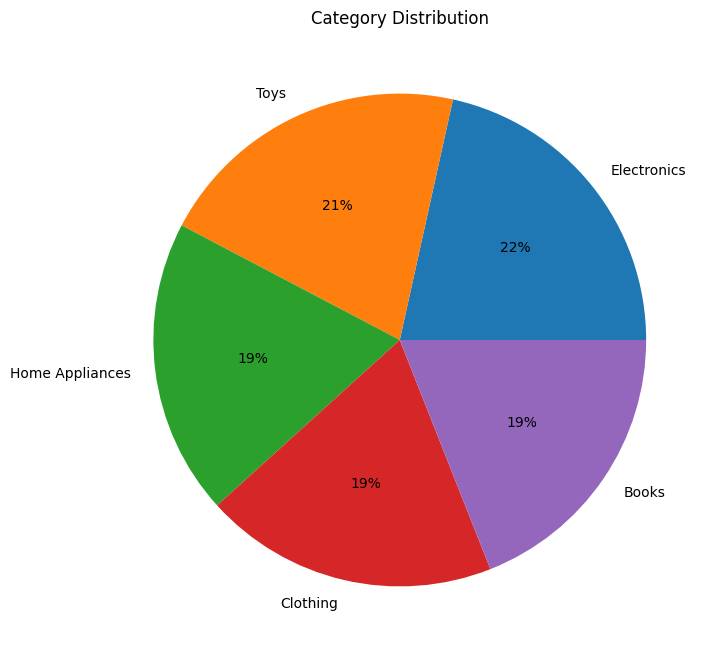

In [ ]:
# Create a pie chart of the Category column
plt.figure(figsize=(8, 8))

counts = df["Category"].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.0f%%')
plt.title('Category Distribution')

plt.show()

Almost balanced Category distribution among these five options

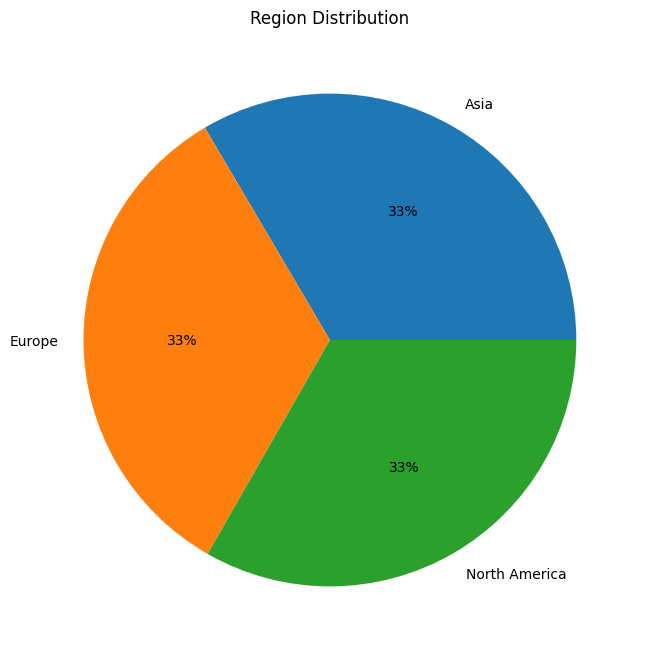

In [ ]:
# Create a pie chart of the Region column
plt.figure(figsize=(8, 8))

counts = df["Region"].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.0f%%')
plt.title('Region Distribution')

plt.show()

The distribution among the regions is perfectly balanced

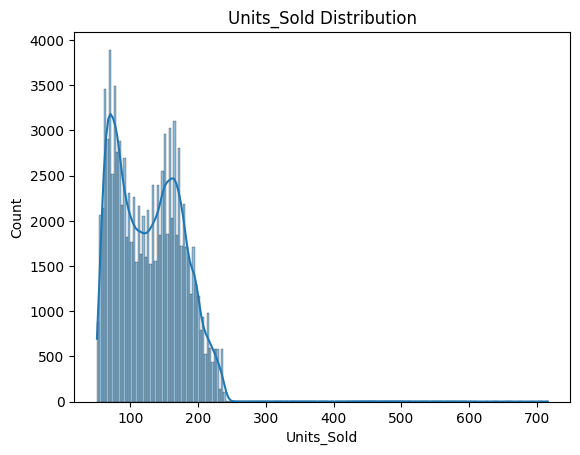

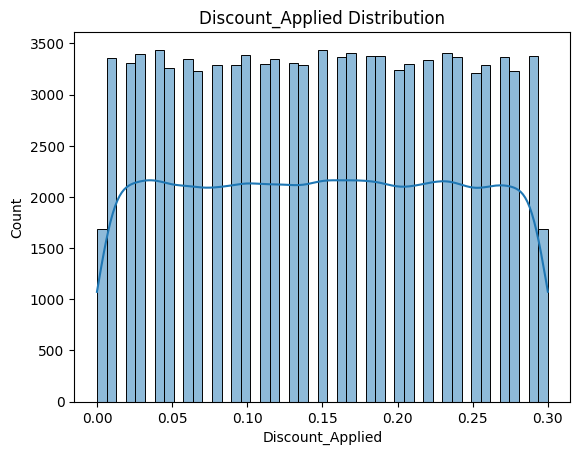

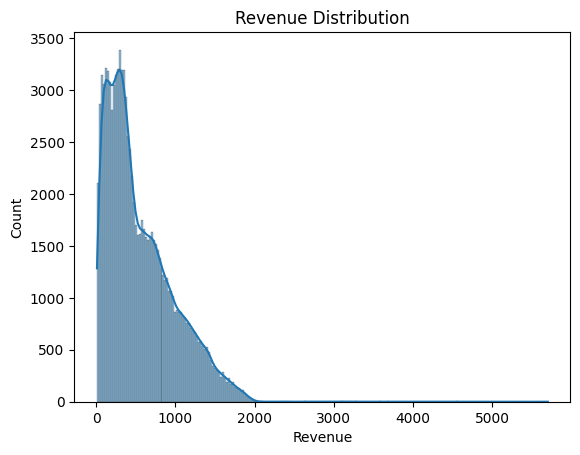

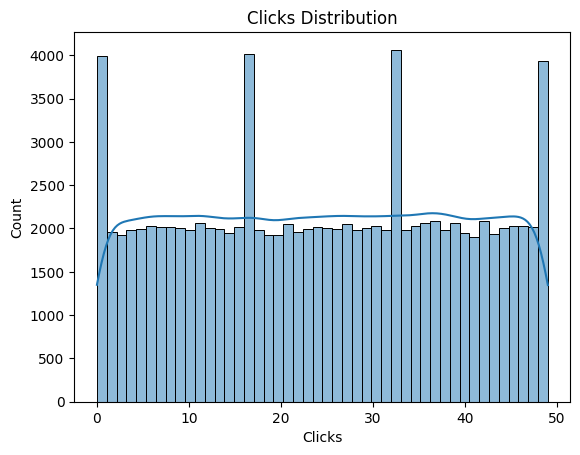

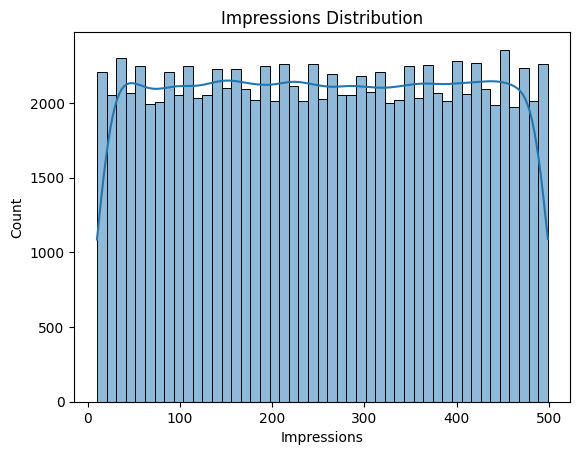

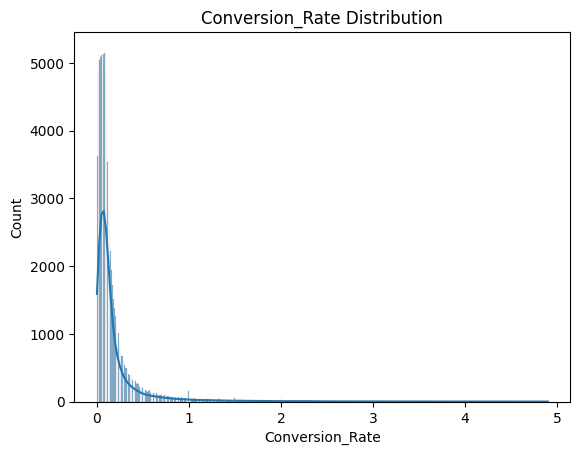

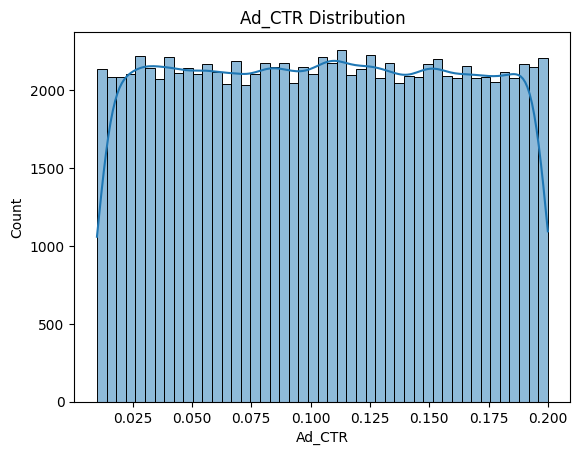

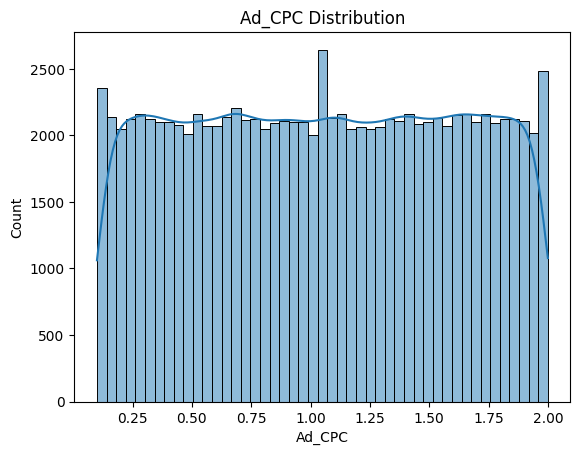

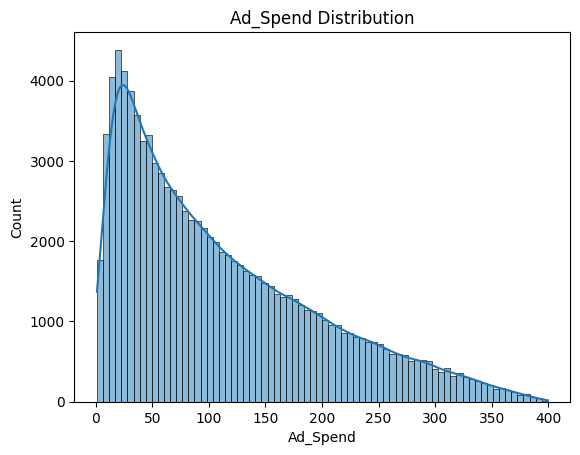

In [ ]:
# Numerical Cols Distribution
cols=np.array(df.select_dtypes(include=['int64', 'float64']).columns)
for col in cols:
    sns.histplot(df[col], kde=True)
    plt.title(f'{col} Distribution')
    plt.show()

Some of the columns (Ad_Spend, Revenue, Conversion_Rate) are exponentially distributed --> log scaling

Others (Ad_CPC, Ad_CTR, Clicks, Impressions, Discount_Applied) are uniformly distributed --> min-max scaling

Bivariate Analysis

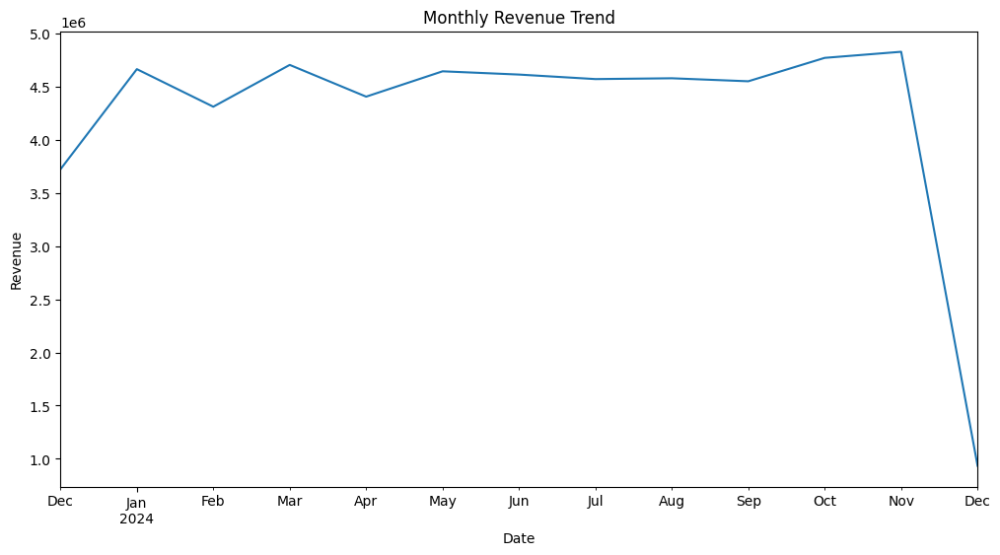

In [ ]:
# Revenue over time (aggregated Monthly)
weekly_revenue = df.groupby(pd.Grouper(key='Transaction_Date', freq='ME'))['Revenue'].sum()
weekly_revenue.plot(title='Monthly Revenue Trend', figsize=(12,6))
plt.ylabel('Revenue')
plt.xlabel('Date')
plt.show()

November is the month with the highest revenue

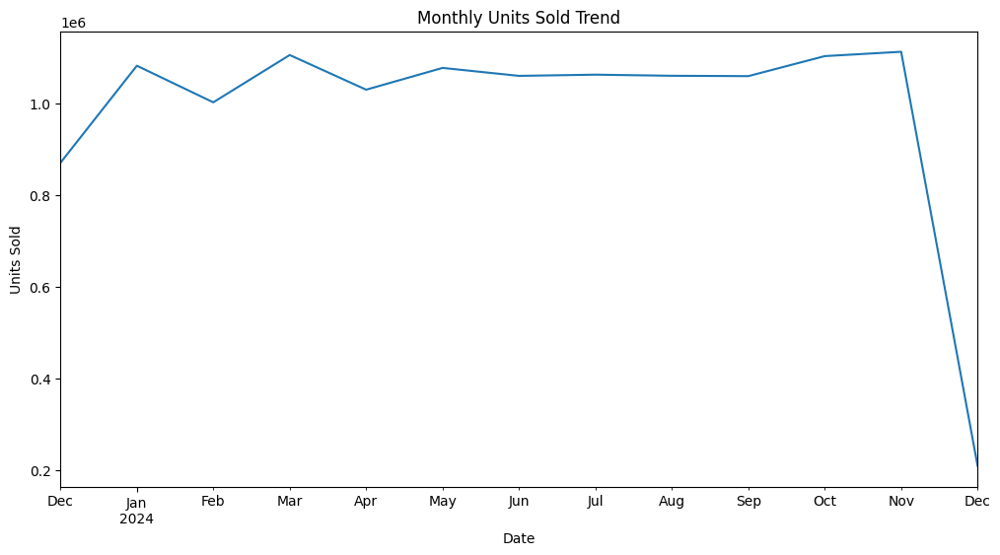

In [ ]:
# Units Sold over time
weekly_units = df.groupby(pd.Grouper(key='Transaction_Date', freq='ME'))['Units_Sold'].sum()
weekly_units.plot(title='Monthly Units Sold Trend', figsize=(12,6))
plt.ylabel('Units Sold')
plt.xlabel('Date')
plt.show()

The highest no of units sold is also in November which does make sense

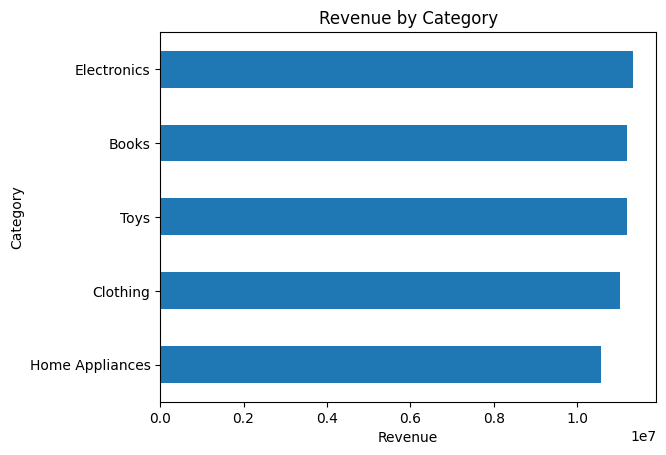

In [ ]:
# Revenue by Category
category_revenue = df.groupby('Category')['Revenue'].sum().sort_values()
category_revenue.plot(kind='barh', title='Revenue by Category')
plt.xlabel('Revenue')
plt.show()

Almost the same revenue across the categories (Electronics is higher a little bit)

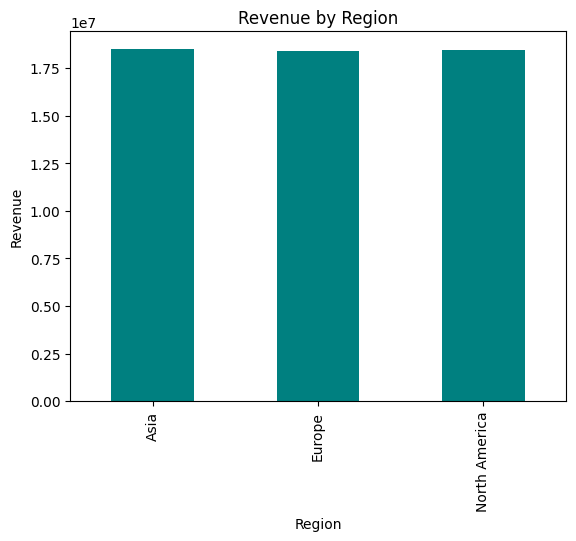

In [ ]:
# Revenue by Region
region_rev = df.groupby('Region')['Revenue'].sum()
region_rev.plot(kind='bar', title='Revenue by Region', color='teal')
plt.ylabel('Revenue')
plt.show()

The revenue is the same across the regions

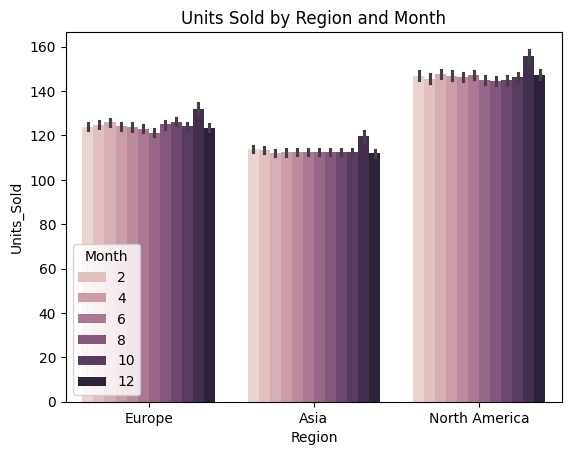

In [ ]:
# Units Sold by Region and Season
df['Month'] = df['Transaction_Date'].dt.month
sns.barplot(data=df, x='Region', y='Units_Sold', hue='Month')
plt.title('Units Sold by Region and Month')
plt.show()

The highest no of units sold is at North America in November

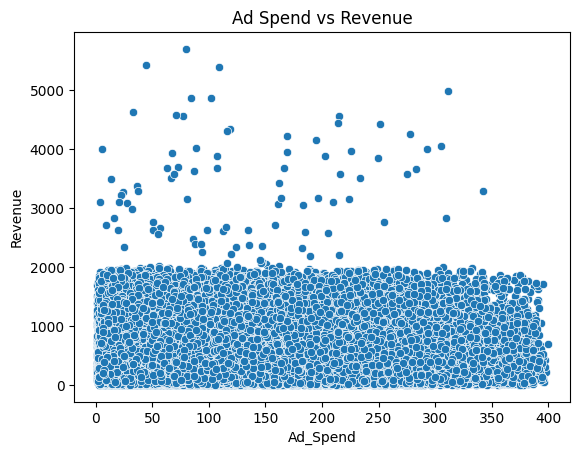

In [ ]:
# Ad Spend vs Revenue
sns.scatterplot(data=df, x='Ad_Spend', y='Revenue')
plt.title('Ad Spend vs Revenue')
plt.show()

This shows the advertising effect on the revenue



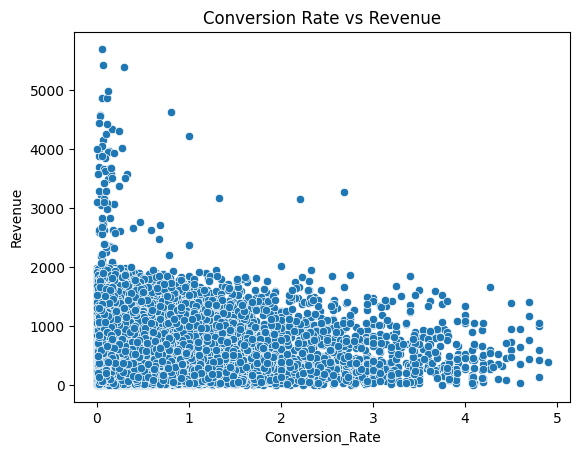

In [ ]:
# Conversion Rate vs Revenue
sns.scatterplot(data=df, x='Conversion_Rate', y='Revenue')
plt.title('Conversion Rate vs Revenue')
plt.show()

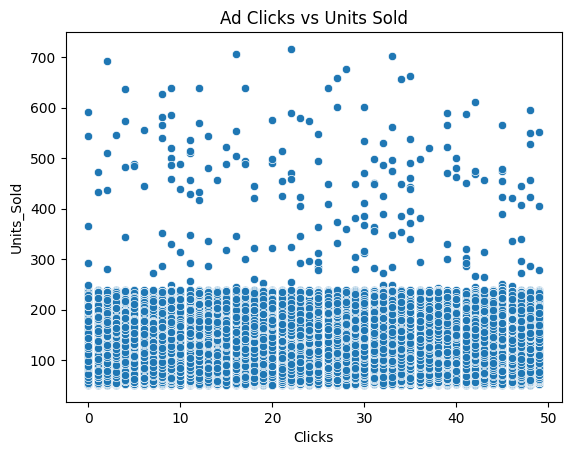

In [ ]:
# Clicks vs Units Sold
sns.scatterplot(data=df, x='Clicks', y='Units_Sold')
plt.title('Ad Clicks vs Units Sold')
plt.show()

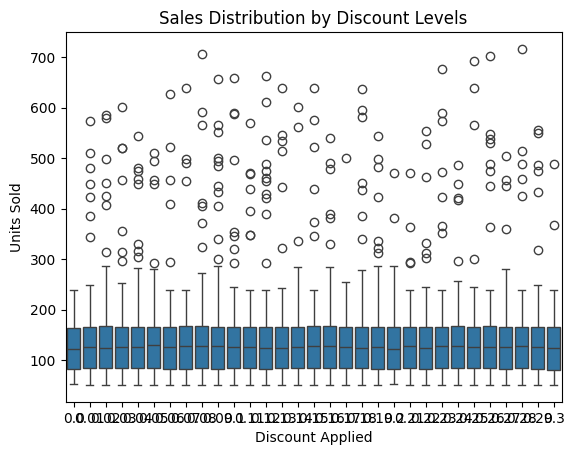

In [3]:
sns.boxplot(x='Discount_Applied', y='Units_Sold', data=df)
plt.title('Sales Distribution by Discount Levels')
plt.xlabel('Discount Applied')
plt.ylabel('Units Sold')
plt.show()

In [5]:
# The dataset is from the US
us_holidays = holidays.US()

# Create a Holiday flag column
df['Holiday'] = df['Transaction_Date'].apply(lambda x: 1 if x in us_holidays else 0)

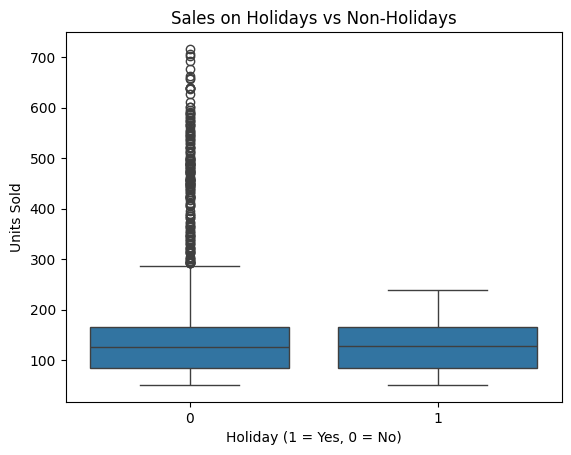

In [6]:
sns.boxplot(x='Holiday', y='Units_Sold', data=df)
plt.title('Sales on Holidays vs Non-Holidays')
plt.xlabel('Holiday (1 = Yes, 0 = No)')
plt.ylabel('Units Sold')
plt.show()

The median number of units sold is slightly higher on holidays than on non-holidays, indicating a potential boost in sales during holidays.

There are significantly more extreme high outliers on non-holidays than holidays, indicating occasional promotional campaigns or irregular sales spikes on non-holidays to attract customers.

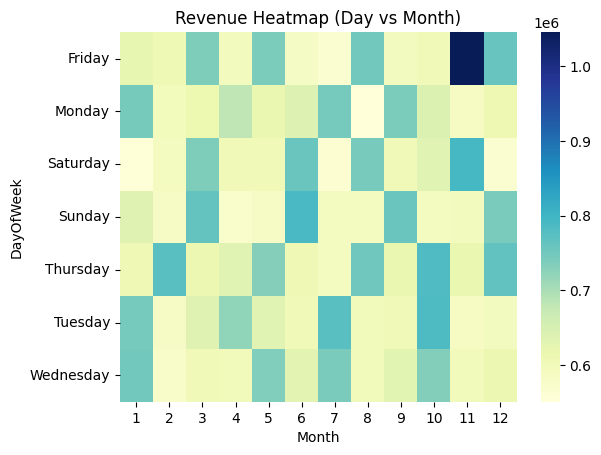

In [ ]:
# Heatmap of Revenue by Day of Week and Month
df['DayOfWeek'] = df['Transaction_Date'].dt.day_name()
heatmap_data = df.pivot_table(index='DayOfWeek', columns='Month', values='Revenue', aggfunc='sum')
sns.heatmap(heatmap_data, cmap='YlGnBu')
plt.title('Revenue Heatmap (Day vs Month)')
plt.show()

October and November has highest correlations as demonstrated from the other analysis in addition to having the hghest correlation on Friday (which does make sense)

In [12]:
# Time Series Trend
fig = px.line(df, x='Transaction_Date', y='Units_Sold', title='Time Series of Units Sold')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

As shown previously, November has the highest number of units_sold

In [10]:
# Units Sold vs Discount Scatter Plot
fig = px.scatter(df, x='Discount_Applied', y='Units_Sold',
                  color='Holiday',
                  title='Units Sold vs Discount Applied (Colored by Holiday)')
fig.show()

Multivariate Analysis

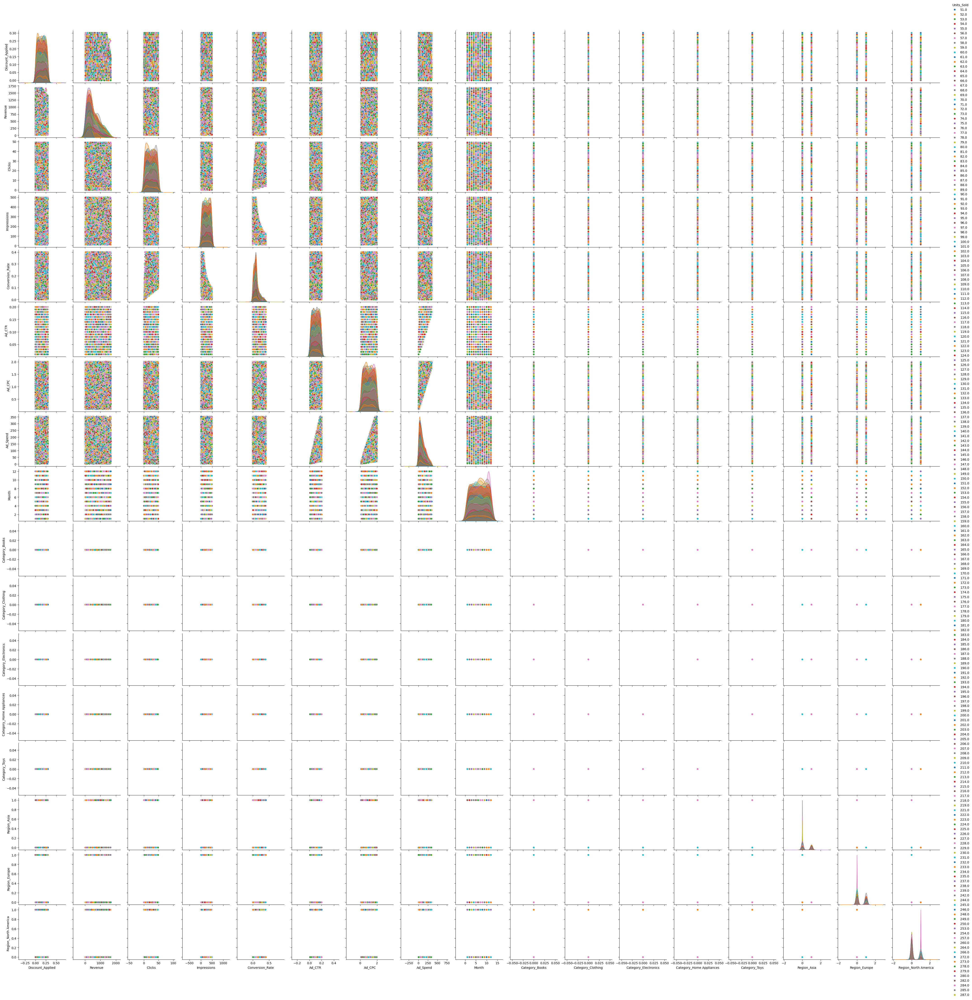

In [ ]:
sns.pairplot(df,hue='Units_Sold',kind='scatter',palette="tab10")

Feature Engineering

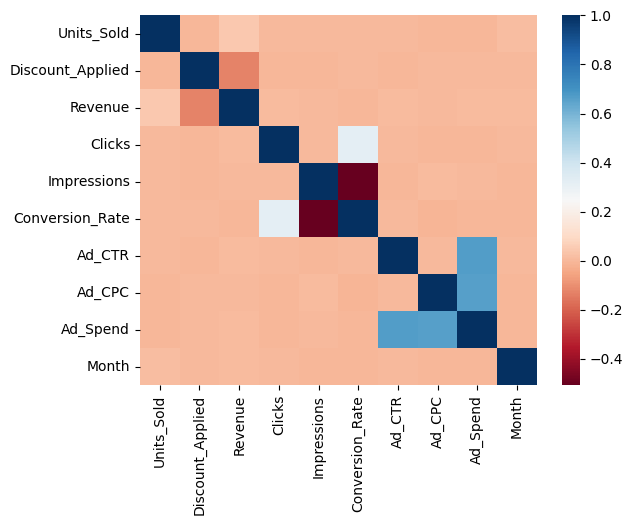

In [ ]:
# Heatmap
numerical_cols = df.select_dtypes(include=['number']).columns
sns.heatmap(df[numerical_cols].corr(), cmap="RdBu")
plt.show()

Check what is not too correlated with the target col (units_sold) and leave it while checking the most correlated features (>0.8) to remove them

In [ ]:
columns = df.select_dtypes(include=np.number)
correlation_matrix = columns.corr()
# Identify columns to drop
to_drop = set()

for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        # Check correlation threshold
        if correlation_matrix.iloc[i, j] > 0.8:
            col_to_drop = correlation_matrix.columns[j]
            to_drop.add(col_to_drop)

# Drop the highly correlated columns
df.drop(columns=to_drop, inplace=True)
print("Dropped columns:", to_drop)

Dropped columns: set()


Rounding the float cols to avoid noise effects

In [ ]:
float_cols = df.select_dtypes(include=['float64']).columns
df[float_cols] = df[float_cols].round(2)

Processing Categorical Cols

One hot encoding: https://www.geeksforgeeks.org/ml-one-hot-encoding/

In [ ]:
# Use pd.get_dummies() to one-hot encode the categorical columns
categorical_columns = ['Category', 'Region']
df_pandas_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=True)

encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

one_hot_encoded = encoder.fit_transform(df[categorical_columns])

# Get feature names and make them unique by prefixing with category
feature_names = encoder.get_feature_names_out(categorical_columns)

one_hot_df = pd.DataFrame(one_hot_encoded,
                          columns=feature_names)

# Reset index of both DataFrames before concatenating
df = pd.concat([df.drop(categorical_columns, axis=1).reset_index(drop=True),
                                 one_hot_df.reset_index(drop=True)], axis=1)

Outliers Handling

https://byjus.com/maths/interquartile-range/

In [ ]:
numeric_cols = df.select_dtypes(include=['number']).columns
for column in numeric_cols:

    # Calculate the first quartile (Q1) and third quartile (Q3)
    q1, q3 = np.percentile(df[column], [25, 75])

    # Calculate the interquartile range (IQR)
    iqr = q3 - q1

    # Set the lower and upper bounds for outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Replace outliers with the median value (Q2)
    df[column] = np.where((df[column] < lower_bound) | (df[column] > upper_bound), np.median(df[column]), df[column])

Scaling Based on the cols distribution

In [ ]:
# Define column groups
log_cols = ['Ad_Spend', 'Revenue', 'Conversion_Rate']
minmax_cols = ['Ad_CPC', 'Ad_CTR', 'Clicks', 'Impressions', 'Discount_Applied']

# Make a copy of the original DataFrame
df_transformed = df.copy()

# Apply log1p transformation to log-distributed columns
df_transformed[log_cols] = df_transformed[log_cols].apply(np.log1p)

# Apply Min-Max scaling to uniform columns
scaler = MinMaxScaler()
df_transformed[minmax_cols] = scaler.fit_transform(df_transformed[minmax_cols])

In [ ]:
# Export to csv
df_transformed.to_csv('PreparedSalesData.csv', index = False)

Train-Test Split

In [ ]:
# Separate features and target variable
X=df_transformed.drop(["Units_Sold"],axis=1)
y=df_transformed["Units_Sold"]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)